<a href="https://colab.research.google.com/github/janaelkasabyy/Data-Engineering-project/blob/main/Img_processing_lab_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Libraries

In [54]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

from IPython.display import Video
from ultralytics import YOLO

# part 2: Load the image


In [10]:
img = cv2.imread('pedestrians.jpg')
print(img.shape) # the 3 is for the color model --> (RGB)

(800, 1200, 3)


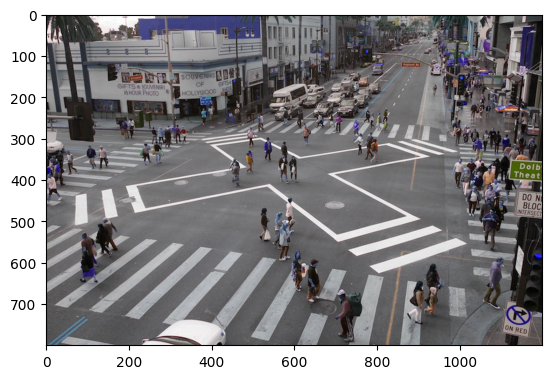

In [12]:
plt.imshow(img)

In [16]:
#Open cv reads the img in BGR
rgbImg = cv2.cvtColor(img,cv2.COLOR_BGR2RGB) #Converting the openCv color reading from BGR into RGB

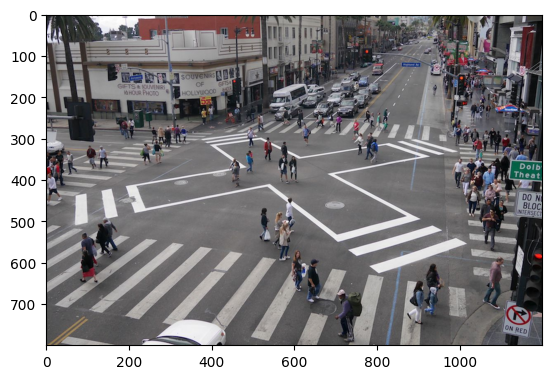

In [18]:
plt.imshow(rgbImg)

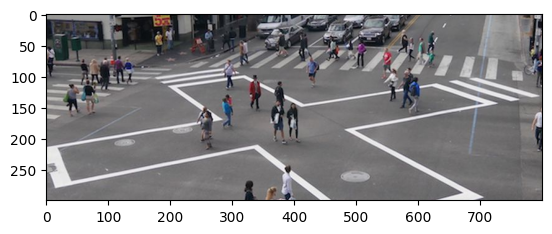

In [20]:
# Slicing a numpy array in order to crop the image
croppedImg = rgbImg[200: 500, 200: 1000]
plt.imshow(croppedImg)

# Slicing/ cropping the image

In [22]:
croppedImg.shape

(300, 800, 3)

In [23]:
# Calculating the image pixels
(croppedImg.shape[0] * croppedImg.shape[1]) * croppedImg.shape[2]

720000

## Converting the img into a gray scale img

In [25]:
grayImg = cv2.cvtColor(rgbImg, cv2.COLOR_RGB2GRAY)
grayImg.shape # 800, 1200 --> Only 2 dimensions as for the gray scale img (not RGB)

(800, 1200)

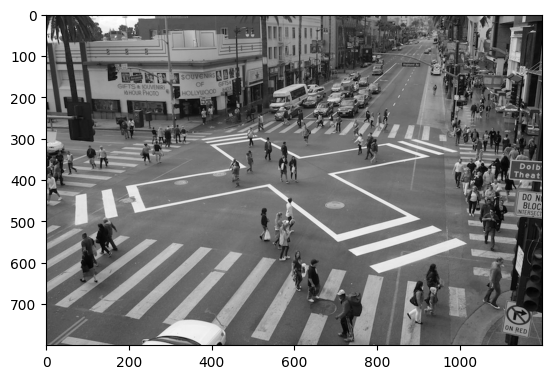

In [27]:
plt.imshow(grayImg, cmap = 'gray')

# The difference between the gray image and the binary image is:
## Binary images only output 1s and 0s --> so the image colors are either white or black

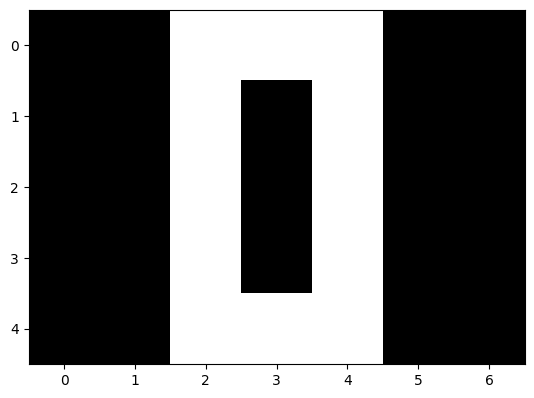

In [38]:
tafficSign = np.array([
    [0, 0, 1, 1, 1, 0, 0],
    [0, 0, 1, 0, 1, 0, 0],
    [0, 0, 1, 0, 1, 0, 0],
    [0, 0, 1, 0, 1, 0, 0],
    [0, 0, 1, 1, 1, 0, 0]
    ]
)
plt.imshow(tafficSign,cmap = 'gray')

#Video editing

In [41]:
cap = cv2.VideoCapture('road.mp4')

In [44]:
Video('road.mp4', embed = True)

In [46]:
FramesList = []

i = 0 # A counter to restrict the frames reading to a specific number because the video is too long

while i < 500: # 1st 500 frames
  ret, frame = cap.read()
  FramesList.append(frame)
  i = i + 1

  if not ret:
    print("End of stream !")
    break;

cap.release()
cv2.destroyAllWindows()

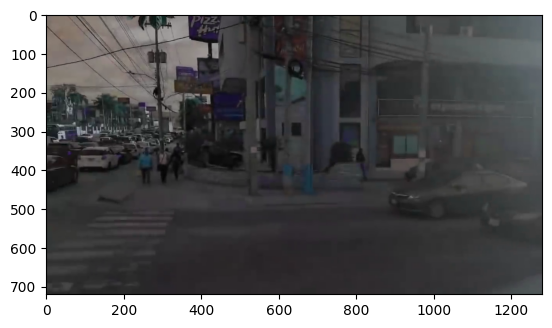

In [52]:
plt.imshow(FramesList[20]) #The first second

In [53]:
!pip install ultralytics

In [55]:
model = YOLO("yolov8m.pt")

100%|██████████| 49.7M/49.7M [00:00<00:00, 207MB/s]


In [56]:
results = model.predict(source="pedestrians.jpg", save=True, conf=0.2, iou=0.5)


image 1/1 /content/pedestrians.jpg: 448x640 32 persons, 11 cars, 1 bus, 2 trucks, 4 traffic lights, 3 backpacks, 2558.0ms
Speed: 17.6ms preprocess, 2558.0ms inference, 34.6ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict


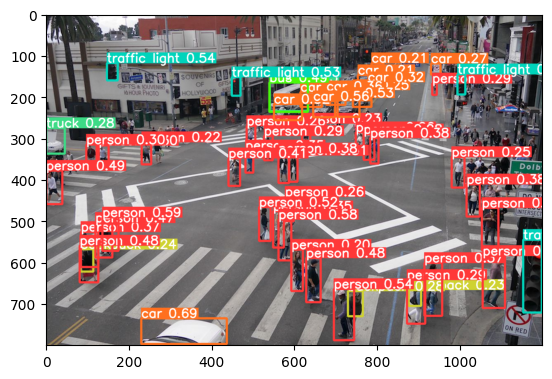

In [57]:
# Plotting results
plot = results[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
plt.imshow(plot)
#The decimal points above each object stand for the confidence that the object is true